# Spatial Transcriptomics Analysis

This notebook demonstrates a comprehensive spatial transcriptomics analysis workflow covering:
- Spatially variable genes detection
- Spatial gene modules identification
- Neighborhood and co-occurrence analysis
- Spatial domain detection
- Cell-cell communication analysis
- Advanced spatial patterns

**Author:** Generated for ST Course  
**Date:** 2026-02-06  
**Input Data:** adult_mouse_brain_ST4k.h5ad

## Workflow Overview:
1. Data Loading & Preprocessing
2. Spatially Variable Genes (Moran's I, Geary's C)
3. Spatial Gene Modules (Hotspot)
4. Neighborhood Analysis (Squidpy)
5. Spatial Domains Detection
6. Ligand-Receptor Interactions
7. Spatial Gradients & Trajectories
8. Integration & Summary

## 1. Setup and Configuration

First, we'll import all necessary libraries and configure plotting parameters including a consistent color scheme throughout the notebook.

In [3]:
# Install required packages (run once)
!pip install -q scanpy squidpy hotspotsc leidenalg python-igraph scipy numpy pandas matplotlib seaborn

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.9/193.9 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 61.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.6/176.6 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.6/51.6 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.3/192.3 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.7/44.7 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 284.1/284

In [4]:
# Core libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
from scipy.sparse import issparse

# Spatial transcriptomics libraries
import scanpy as sc
import squidpy as sq
import anndata as ad

# Configure settings
warnings.filterwarnings('ignore')
sc.settings.verbosity = 1
sc.settings.set_figure_params(dpi=100, facecolor='white', frameon=False)
sc.logging.print_header()

# Set random seed for reproducibility
np.random.seed(42)

print(f"\nPackage versions:")
print(f"  Scanpy: {sc.__version__}")
print(f"  Squidpy: {sq.__version__}")
print(f"  AnnData: {ad.__version__}")


Package versions:
  Scanpy: 1.12
  Squidpy: 1.8.1
  AnnData: 0.12.10


In [5]:
# Define color scheme for consistent visualizations
COLORS = {
    'primary': '#2E86AB',      # Blue
    'secondary': '#A23B72',    # Purple
    'tertiary': '#F18F01',     # Orange
    'quaternary': '#C73E1D',   # Red
    'accent1': '#6A994E',      # Green
    'accent2': '#BC4B51',      # Rose
    'light_gray': '#E5E5E5',
    'dark_gray': '#4A4A4A'
}

# Create color palette for clusters (up to 20 colors)
CLUSTER_COLORS = [
    '#E63946', '#F1FAEE', '#A8DADC', '#457B9D', '#1D3557',
    '#F77F00', '#D62828', '#003049', '#669BBC', '#780000',
    '#C1121F', '#FDF0D5', '#003049', '#780116', '#F7B801',
    '#F18701', '#F35B04', '#C1121F', '#669BBC', '#023047'
]

# Matplotlib style configuration
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.grid'] = False
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10

print("✓ Color scheme and plotting parameters configured")

✓ Color scheme and plotting parameters configured


## 2. Data Loading and Preprocessing

We'll load the adult mouse brain spatial transcriptomics dataset and perform basic preprocessing including:
- Quality control
- Normalization
- Feature selection
- Dimensionality reduction

In [6]:
!pip install gdown
import gdown

url = "https://drive.google.com/uc?id=1lRM-tR1MMbtgyKXLqRzV2YxokweiNUMz"
data_path = "adult_mouse_brain_ST4k.h5ad"
gdown.download(url, data_path, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1lRM-tR1MMbtgyKXLqRzV2YxokweiNUMz
To: /content/adult_mouse_brain_ST4k.h5ad
100%|██████████| 5.71M/5.71M [00:00<00:00, 57.7MB/s]


'adult_mouse_brain_ST4k.h5ad'

In [7]:
# Load the spatial transcriptomics data
data_path = 'adult_mouse_brain_ST4k.h5ad'
adata = sc.read_h5ad(data_path)

print("\n" + "="*80)
print("DATA OVERVIEW")
print("="*80)
print(f"Number of spots: {adata.n_obs:,}")
print(f"Number of genes: {adata.n_vars:,}")
print(f"\nAnnData object:")
print(adata)

# Check spatial coordinates
if 'spatial' in adata.obsm.keys():
    print(f"\n✓ Spatial coordinates available: {adata.obsm['spatial'].shape}")
else:
    print("\n⚠ Warning: No spatial coordinates found!")


DATA OVERVIEW
Number of spots: 4,000
Number of genes: 20,062

AnnData object:
AnnData object with n_obs × n_vars = 4000 × 20062
    obs: 'n_genes_by_counts'
    var: 'Symbol'
    obsm: 'spatial'

✓ Spatial coordinates available: (4000, 3)


In [8]:
# Basic preprocessing
print("\n" + "="*80)
print("PREPROCESSING")
print("="*80)

# Calculate QC metrics
adata.var['mt'] = adata.var_names.str.startswith('mt-') | adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

# Filter low quality spots
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

# Save raw counts
adata.layers['counts'] = adata.X.copy()

# Normalize and log transform
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Store normalized data
adata.raw = adata.copy()

# Identify highly variable genes
sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor='seurat')

print(f"\n✓ Preprocessing complete")
print(f"  Final spots: {adata.n_obs:,}")
print(f"  Final genes: {adata.n_vars:,}")
print(f"  Highly variable genes: {adata.var['highly_variable'].sum():,}")


PREPROCESSING

✓ Preprocessing complete
  Final spots: 3,862
  Final genes: 14,525
  Highly variable genes: 2,000


In [9]:
# Dimensionality reduction for downstream analyses
sc.tl.pca(adata, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=30)
sc.tl.umap(adata, min_dist=0.3)

# Clustering for reference
sc.tl.leiden(adata, resolution=0.5, key_added='leiden')

print("✓ PCA, neighbors, UMAP, and clustering computed")
print(f"  Number of clusters: {adata.obs['leiden'].nunique()}")

✓ PCA, neighbors, UMAP, and clustering computed
  Number of clusters: 3


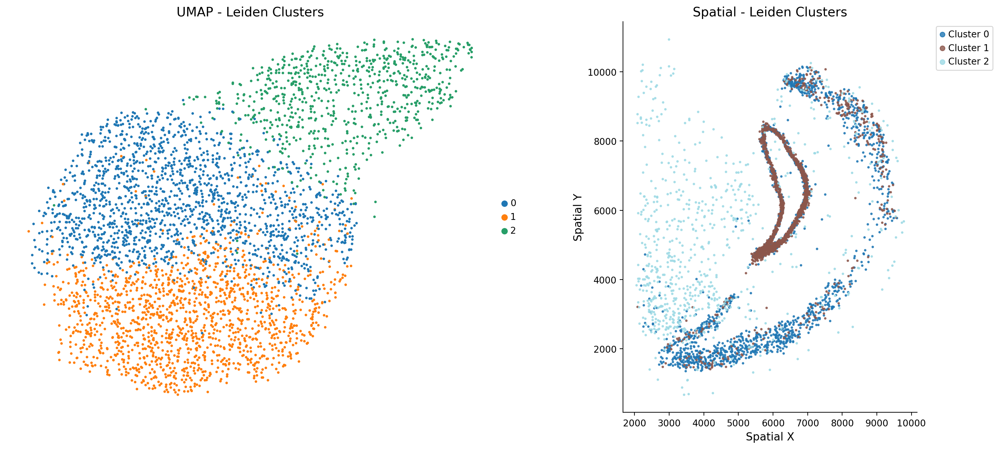


✓ Initial clustering visualization complete


In [10]:
# Visualize spatial distribution of clusters
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# UMAP
sc.pl.umap(adata, color='leiden', ax=axes[0], show=False, frameon=False, title='UMAP - Leiden Clusters')

# Spatial
if 'spatial' in adata.obsm.keys():
    coords = adata.obsm['spatial']
    clusters = adata.obs['leiden'].astype(int)
    n_clusters = clusters.nunique()

    colors = plt.cm.tab20(np.linspace(0, 1, n_clusters))

    for cluster_id in range(n_clusters):
        mask = clusters == cluster_id
        axes[1].scatter(coords[mask, 0], coords[mask, 1],
                       c=[colors[cluster_id]], label=f'Cluster {cluster_id}',
                       s=3, alpha=0.8)

    axes[1].set_xlabel('Spatial X')
    axes[1].set_ylabel('Spatial Y')
    axes[1].set_title('Spatial - Leiden Clusters')
    axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=3)
    axes[1].set_aspect('equal')
    axes[1].spines['top'].set_visible(False)
    axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

print("\n✓ Initial clustering visualization complete")

## 3. Spatially Variable Genes Detection

### 3.1 Moran's I Spatial Autocorrelation

Moran's I is a measure of spatial autocorrelation that quantifies the degree to which gene expression at one location is similar to expression at nearby locations.

**Interpretation:**
- Moran's I > 0: Positive spatial autocorrelation (similar values cluster together)
- Moran's I ≈ 0: Random spatial pattern
- Moran's I < 0: Negative spatial autocorrelation (dissimilar values cluster together)

**Statistical significance:** p-value tests whether the observed pattern is significantly different from random.

In [11]:
# Build spatial graph for Moran's I calculation
# This creates connections between spatially neighboring spots
sq.gr.spatial_neighbors(adata, coord_type='generic', n_neighs=6)

print("✓ Spatial neighborhood graph constructed")
print(f"  Adjacency matrix shape: {adata.obsp['spatial_connectivities'].shape}")

INFO     Creating graph using `generic` coordinates and `None` transform and `1` libraries.                        
✓ Spatial neighborhood graph constructed
  Adjacency matrix shape: (3862, 3862)


In [12]:
# Calculate Moran's I for all genes
# This tests each gene for spatial autocorrelation
sq.gr.spatial_autocorr(
    adata,
    mode='moran',
    n_perms=100,  # Number of permutations for p-value calculation
    n_jobs=1
)

print("\n✓ Moran's I calculated for all genes")

# Filter significant spatially variable genes
morans_results = adata.uns['moranI']
significant_genes = morans_results[morans_results['pval_norm_fdr_bh'] < 0.05]
significant_genes = significant_genes.sort_values('I', ascending=False)

print(f"\nNumber of significant spatially variable genes (FDR < 0.05): {len(significant_genes)}")
print(f"\nTop 10 spatially variable genes:")
print(significant_genes.head(10)[['I', 'pval_norm', 'pval_norm_fdr_bh']])

  0%|          | 0/100 [00:00<?, ?/s]


✓ Moran's I calculated for all genes

Number of significant spatially variable genes (FDR < 0.05): 268

Top 10 spatially variable genes:
               I  pval_norm  pval_norm_fdr_bh
Plp1    0.362942        0.0               0.0
Mbp     0.303806        0.0               0.0
Trh     0.264008        0.0               0.0
Atp1a2  0.251067        0.0               0.0
Nrgn    0.247572        0.0               0.0
Ncdn    0.220389        0.0               0.0
Olfm1   0.214536        0.0               0.0
Trpm3   0.212293        0.0               0.0
Mobp    0.194207        0.0               0.0
Lsamp   0.192023        0.0               0.0


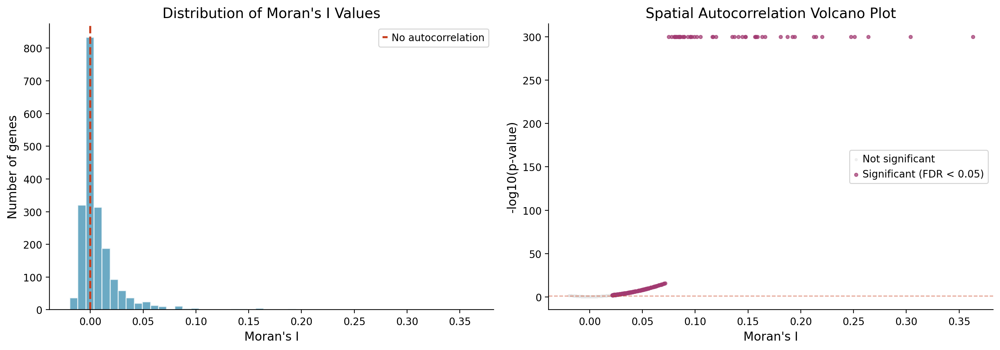


✓ Moran's I distribution plots generated


In [13]:
# Visualize Moran's I distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram of Moran's I values
axes[0].hist(morans_results['I'], bins=50, color=COLORS['primary'], alpha=0.7, edgecolor='white')
axes[0].axvline(x=0, color=COLORS['quaternary'], linestyle='--', linewidth=2, label='No autocorrelation')
axes[0].set_xlabel("Moran's I")
axes[0].set_ylabel('Number of genes')
axes[0].set_title("Distribution of Moran's I Values")
axes[0].legend()
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# Volcano plot: Moran's I vs -log10(p-value)
morans_results['-log10_pval'] = -np.log10(morans_results['pval_norm'] + 1e-300)
significant_mask = morans_results['pval_norm_fdr_bh'] < 0.05

axes[1].scatter(morans_results.loc[~significant_mask, 'I'],
                morans_results.loc[~significant_mask, '-log10_pval'],
                c=COLORS['light_gray'], s=5, alpha=0.5, label='Not significant')
axes[1].scatter(morans_results.loc[significant_mask, 'I'],
                morans_results.loc[significant_mask, '-log10_pval'],
                c=COLORS['secondary'], s=10, alpha=0.7, label='Significant (FDR < 0.05)')
axes[1].axhline(y=-np.log10(0.05), color=COLORS['quaternary'], linestyle='--', linewidth=1, alpha=0.5)
axes[1].set_xlabel("Moran's I")
axes[1].set_ylabel('-log10(p-value)')
axes[1].set_title('Spatial Autocorrelation Volcano Plot')
axes[1].legend()
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

print("\n✓ Moran's I distribution plots generated")

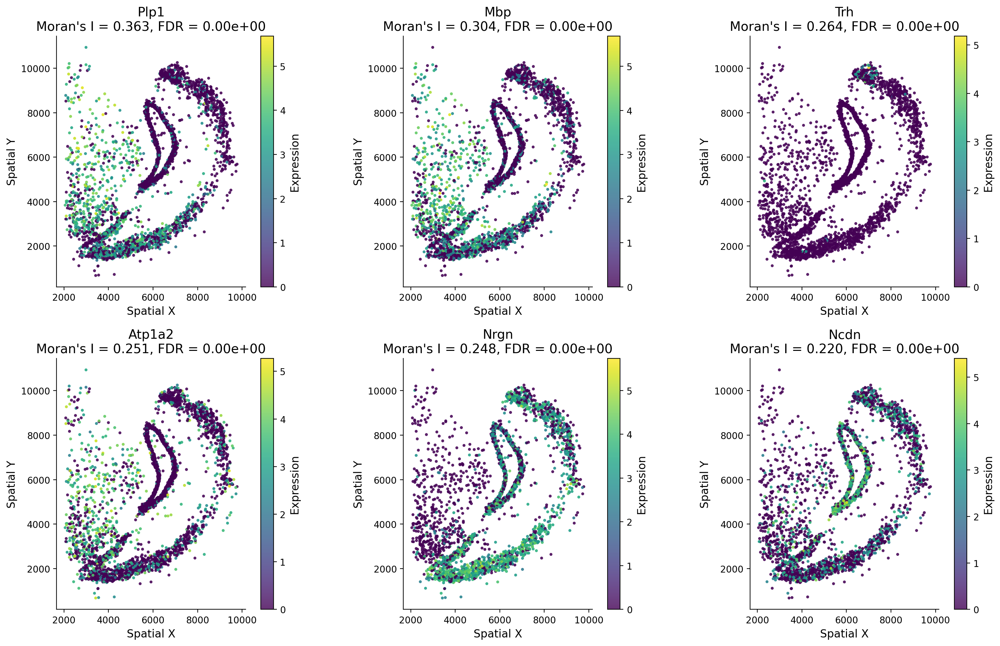


✓ Top spatially variable genes visualization complete


In [14]:
# Visualize top spatially variable genes
top_genes = significant_genes.head(6).index.tolist()

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

coords = adata.obsm['spatial']

for idx, gene in enumerate(top_genes):
    if gene in adata.var_names:
        gene_idx = adata.var_names.get_loc(gene)
        expression = adata.X[:, gene_idx].toarray().flatten() if issparse(adata.X) else adata.X[:, gene_idx]

        scatter = axes[idx].scatter(coords[:, 0], coords[:, 1],
                                   c=expression, cmap='viridis',
                                   s=5, alpha=0.8)

        morans_i = morans_results.loc[gene, 'I']
        pval = morans_results.loc[gene, 'pval_norm_fdr_bh']

        axes[idx].set_title(f"{gene}\nMoran's I = {morans_i:.3f}, FDR = {pval:.2e}")
        axes[idx].set_xlabel('Spatial X')
        axes[idx].set_ylabel('Spatial Y')
        axes[idx].set_aspect('equal')
        axes[idx].spines['top'].set_visible(False)
        axes[idx].spines['right'].set_visible(False)

        plt.colorbar(scatter, ax=axes[idx], label='Expression')

plt.tight_layout()
plt.show()

print("\n✓ Top spatially variable genes visualization complete")

### 3.2 Alternative Method: Geary's C

Geary's C is another measure of spatial autocorrelation that focuses on differences between neighboring values rather than correlation.

**Interpretation:**
- Geary's C < 1: Positive spatial autocorrelation (similar values cluster)
- Geary's C ≈ 1: Random spatial pattern
- Geary's C > 1: Negative spatial autocorrelation (dissimilar values cluster)

**Comparison with Moran's I:**
- Moran's I is more sensitive to global patterns
- Geary's C is more sensitive to local patterns and outliers

In [15]:
# Calculate Geary's C for comparison
sq.gr.spatial_autocorr(
    adata,
    mode='geary',
    n_perms=100,
    n_jobs=1
)

print("✓ Geary's C calculated for all genes")

# Get results
gearys_results = adata.uns['gearyC']
significant_geary = gearys_results[gearys_results['pval_norm_fdr_bh'] < 0.05]
significant_geary = significant_geary.sort_values('C', ascending=True)  # Lower C = more autocorrelation

print(f"\nNumber of significant spatially variable genes (FDR < 0.05): {len(significant_geary)}")
print(f"\nTop 10 spatially variable genes (by Geary's C):")
print(significant_geary.head(10)[['C', 'pval_norm', 'pval_norm_fdr_bh']])

  0%|          | 0/100 [00:00<?, ?/s]

✓ Geary's C calculated for all genes

Number of significant spatially variable genes (FDR < 0.05): 1359

Top 10 spatially variable genes (by Geary's C):
                C      pval_norm  pval_norm_fdr_bh
Plp1     0.630562   0.000000e+00      0.000000e+00
Eya2     0.682535  5.318623e-288     1.053193e-286
Mbp      0.691456  3.527055e-272     6.915795e-271
Pcdh18   0.701290  2.941737e-255     5.712110e-254
Atp1a2   0.725215  2.227185e-216     4.283047e-215
Zfp879   0.748044  2.673608e-182     5.092587e-181
Gpc5     0.749337  1.856326e-180     3.502502e-179
Adam18   0.750682  1.498135e-178     2.800252e-177
Nrgn     0.753404  1.002634e-174     1.856730e-173
Gm16070  0.754606  4.757246e-173     8.728891e-172


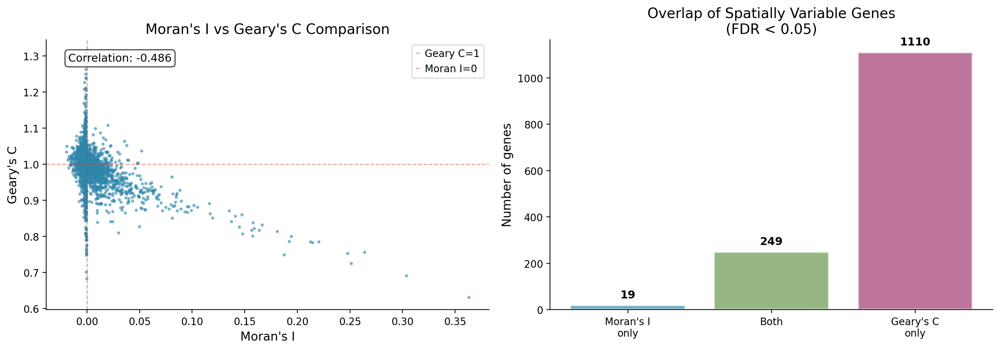


✓ Comparison between Moran's I and Geary's C complete
  Agreement: 18.1% of genes detected by both methods


In [16]:
# Compare Moran's I and Geary's C
comparison_df = pd.DataFrame({
    'morans_i': morans_results['I'],
    'gearys_c': gearys_results['C']
})

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Scatter plot comparing methods
axes[0].scatter(comparison_df['morans_i'], comparison_df['gearys_c'],
                c=COLORS['primary'], s=5, alpha=0.5)
axes[0].axhline(y=1, color=COLORS['quaternary'], linestyle='--', linewidth=1, alpha=0.5, label='Geary C=1')
axes[0].axvline(x=0, color=COLORS['quaternary'], linestyle='--', linewidth=1, alpha=0.5, label='Moran I=0')
axes[0].set_xlabel("Moran's I")
axes[0].set_ylabel("Geary's C")
axes[0].set_title("Moran's I vs Geary's C Comparison")
axes[0].legend()
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# Correlation coefficient
correlation = comparison_df.corr().loc['morans_i', 'gearys_c']
axes[0].text(0.05, 0.95, f'Correlation: {correlation:.3f}',
             transform=axes[0].transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Venn diagram of significant genes
morans_sig_genes = set(morans_results[morans_results['pval_norm_fdr_bh'] < 0.05].index)
gearys_sig_genes = set(gearys_results[gearys_results['pval_norm_fdr_bh'] < 0.05].index)

only_morans = len(morans_sig_genes - gearys_sig_genes)
only_gearys = len(gearys_sig_genes - morans_sig_genes)
both = len(morans_sig_genes & gearys_sig_genes)

categories = ['Moran\'s I\nonly', 'Both', 'Geary\'s C\nonly']
values = [only_morans, both, only_gearys]
colors_list = [COLORS['primary'], COLORS['accent1'], COLORS['secondary']]

axes[1].bar(categories, values, color=colors_list, alpha=0.7, edgecolor='white', linewidth=2)
axes[1].set_ylabel('Number of genes')
axes[1].set_title('Overlap of Spatially Variable Genes\n(FDR < 0.05)')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# Add value labels on bars
for i, v in enumerate(values):
    axes[1].text(i, v + max(values)*0.02, str(v), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

print("\n✓ Comparison between Moran's I and Geary's C complete")
print(f"  Agreement: {both / len(morans_sig_genes | gearys_sig_genes) * 100:.1f}% of genes detected by both methods")

## 4. Spatial Gene Modules with Hotspot

Hotspot identifies modules of genes with coherent spatial expression patterns. Rather than testing genes individually, it groups genes that vary together across space.

**Key concepts:**
- **Autocorrelation:** How much a gene's expression is spatially structured
- **Local correlation:** Which genes have similar spatial patterns
- **Modules:** Groups of genes with coordinated spatial expression

In [17]:
# Try to import hotspot, install if needed
try:
    import hotspot
    print(f"Hotspot version: {hotspot.__version__}")
except ImportError:
    print("Installing hotspot...")
    !pip install -q hotspot-sc
    import hotspot
    print(f"Hotspot version: {hotspot.__version__}")

Hotspot version: 1.1.3


In [18]:
# Prepare data for Hotspot
# Hotspot works best with raw or lightly processed counts
from hotspot import Hotspot

# Get counts data
if 'counts' in adata.layers:
    counts_data = adata.layers['counts']
else:
    counts_data = adata.raw.X if adata.raw is not None else adata.X

# Convert to dense if sparse
if issparse(counts_data):
    counts_data = counts_data.toarray()

# Create DataFrame
counts_df = pd.DataFrame(
    counts_data,
    index=adata.obs_names,
    columns=adata.var_names
)

# Get spatial coordinates
positions = pd.DataFrame(
    adata.obsm['spatial'][:, :2],
    index=adata.obs_names,
    columns=['x', 'y']
)

print("✓ Data prepared for Hotspot")
print(f"  Counts matrix: {counts_df.shape}")
print(f"  Positions: {positions.shape}")

✓ Data prepared for Hotspot
  Counts matrix: (3862, 14525)
  Positions: (3862, 2)


In [27]:
# Use top 2000 variable genes for computational efficiency
variable_genes = adata.var_names[adata.var['highly_variable']].tolist()[:2000]
adata_hvg = adata[:, variable_genes].copy()

# Create Hotspot object and compute spatial weights
hs = Hotspot(
    adata_hvg,
    model='danb',  # Depth-adjusted negative binomial
    latent_obsm_key='X_pca'
)

print("Computing spatial weights...")
hs.create_knn_graph(
    weighted_graph=False,
    n_neighbors=30
)


print("✓ Hotspot object created with spatial graph")

Computing spatial weights...
✓ Hotspot object created with spatial graph


In [28]:


# Compute gene autocorrelation
print("Computing autocorrelations (this may take a few minutes)...")
hs_results = hs.compute_autocorrelations()

# Identify significant genes
hs_genes = hs_results.loc[hs_results['FDR'] < 0.05].sort_values('Z', ascending=False)

print(f"\n✓ Hotspot autocorrelation complete")
print(f"  Significant genes (FDR < 0.05): {len(hs_genes)}")
print(f"\nTop 10 genes by Hotspot Z-score:")
print(hs_genes.head(10)[['C', 'Z', 'Pval', 'FDR']])

Computing autocorrelations (this may take a few minutes)...


100%|██████████| 2000/2000 [00:08<00:00, 230.78it/s]


✓ Hotspot autocorrelation complete
  Significant genes (FDR < 0.05): 480

Top 10 genes by Hotspot Z-score:
                 C           Z  Pval  FDR
Gene                                     
Ncdn      0.607743  239.920532   0.0  0.0
Hpca      0.558004  226.997360   0.0  0.0
Olfm1     0.608327  220.101273   0.0  0.0
Nrgn      0.595366  215.021622   0.0  0.0
Camk2b    0.510729  199.418900   0.0  0.0
Ppp1r1a   0.490720  191.381638   0.0  0.0
Dynlrb1   0.470736  168.486099   0.0  0.0
Atp6v1b2  0.456753  167.989243   0.0  0.0
Plp1      0.523603  167.735565   0.0  0.0
Enc1      0.456261  166.401108   0.0  0.0


In [29]:
# Compute local correlations between genes
if len(hs_genes) >= 50:
    print("Computing local correlations between genes...")
    top_hs_genes = hs_genes.head(500).index  # Use top 500 genes

    local_correlations = hs.compute_local_correlations(top_hs_genes, jobs=1)

    print("✓ Local correlations computed")
    print(f"  Correlation matrix: {local_correlations.shape}")
else:
    print("Not enough significant genes for module detection")
    local_correlations = None

Computing local correlations between genes...
Computing pair-wise local correlation on 480 features...


100%|██████████| 114960/114960 [01:43<00:00, 1111.28it/s]


✓ Local correlations computed
  Correlation matrix: (480, 480)


In [36]:
# Identify gene modules using clustering
if local_correlations is not None:
    print("Identifying gene modules...")
    modules = hs.create_modules(
        min_gene_threshold=20,  # Minimum genes per module
        core_only=True,
        fdr_threshold=0.05
    )

    print(f"\n✓ Gene modules identified")
    print(f"  Number of modules: {len(set(modules.values))}")
    print(f"\nModule sizes:")
    print(modules.value_counts().sort_index())

    # Store in adata
    adata.uns['hotspot_modules'] = modules
else:
    print("Skipping module detection")
    modules = None

Identifying gene modules...

✓ Gene modules identified
  Number of modules: 5

Module sizes:
Module
-1    207
 1    158
 2     33
 3     40
 4     42
Name: count, dtype: int64


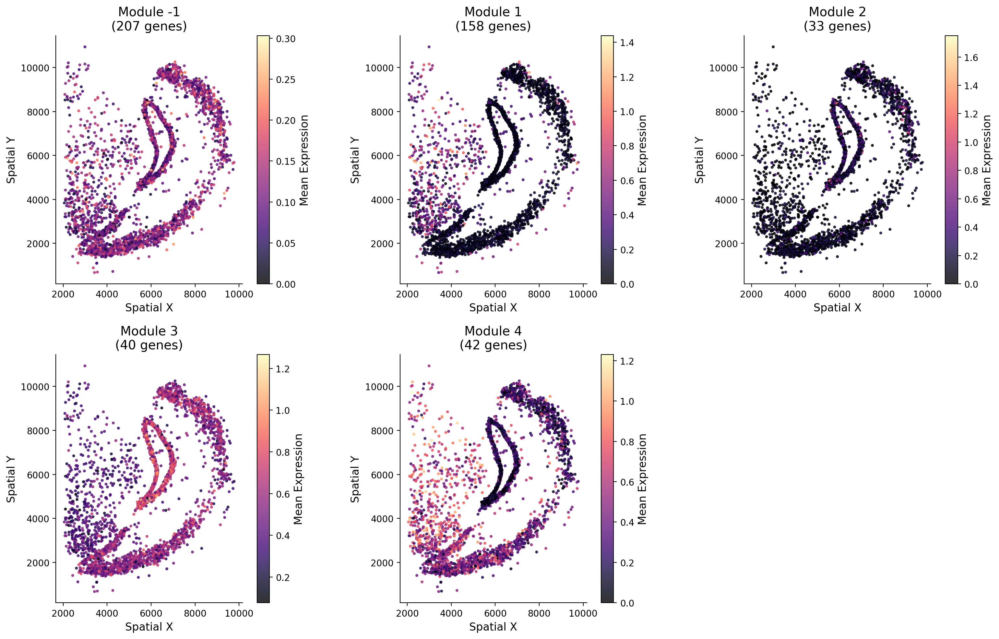


✓ Module spatial patterns visualization complete


In [65]:
# Visualize module expression patterns
if modules is not None and len(modules.unique()) > 0:
    unique_modules = sorted(modules.unique())
    n_modules = min(6, len(unique_modules))  # Show up to 6 modules

    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    axes = axes.flatten()

    coords = adata.obsm['spatial']

    for idx, module_id in enumerate(unique_modules[:n_modules]):
        # Get genes in this module
        module_genes = modules[modules == module_id].index.tolist()

        # Calculate mean expression across module genes
        if len(module_genes) > 0:
            gene_indices = [adata.var_names.get_loc(g) for g in module_genes if g in adata.var_names]
            if len(gene_indices) > 0:
                module_expr = adata.X[:, gene_indices]
                if issparse(module_expr):
                    module_expr = module_expr.toarray()
                mean_expr = module_expr.mean(axis=1)

                scatter = axes[idx].scatter(coords[:, 0], coords[:, 1],
                                           c=mean_expr, cmap='magma',
                                           s=5, alpha=0.8)

                axes[idx].set_title(f"Module {module_id}\n({len(module_genes)} genes)")
                axes[idx].set_xlabel('Spatial X')
                axes[idx].set_ylabel('Spatial Y')
                axes[idx].set_aspect('equal')
                axes[idx].spines['top'].set_visible(False)
                axes[idx].spines['right'].set_visible(False)

                plt.colorbar(scatter, ax=axes[idx], label='Mean Expression')

    # Hide unused subplots
    for idx in range(n_modules, 6):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

    print("\n✓ Module spatial patterns visualization complete")
else:
    print("No modules to visualize")

## 5. Neighborhood and Co-occurrence Analysis with Squidpy

### 5.1 Spatial Neighborhood Graph

We construct a spatial graph connecting each spot to its neighbors, which forms the basis for:
- Neighborhood enrichment analysis
- Co-occurrence testing
- Spatial statistics

In [66]:
# Build spatial neighborhood graph (already computed earlier, but recompute with specific parameters)
sq.gr.spatial_neighbors(
    adata,
    coord_type='generic',
    n_neighs=6,  # Number of nearest neighbors
    radius=None
)

print("✓ Spatial neighborhood graph constructed")
print(f"  Connectivities shape: {adata.obsp['spatial_connectivities'].shape}")
print(f"  Average neighbors per spot: {adata.obsp['spatial_connectivities'].sum(axis=1).mean():.2f}")

INFO     Creating graph using `generic` coordinates and `None` transform and `1` libraries.                        
✓ Spatial neighborhood graph constructed
  Connectivities shape: (3862, 3862)
  Average neighbors per spot: 6.00


### 5.2 Neighborhood Enrichment Analysis

This analysis tests whether certain cluster pairs are found as neighbors more or less often than expected by chance.

**Interpretation:**
- Positive enrichment: Clusters tend to be neighbors (attraction/co-localization)
- Negative enrichment: Clusters tend to avoid each other (repulsion/separation)
- No enrichment: Random spatial distribution

  0%|          | 0/1000 [00:00<?, ?/s]

✓ Neighborhood enrichment computed


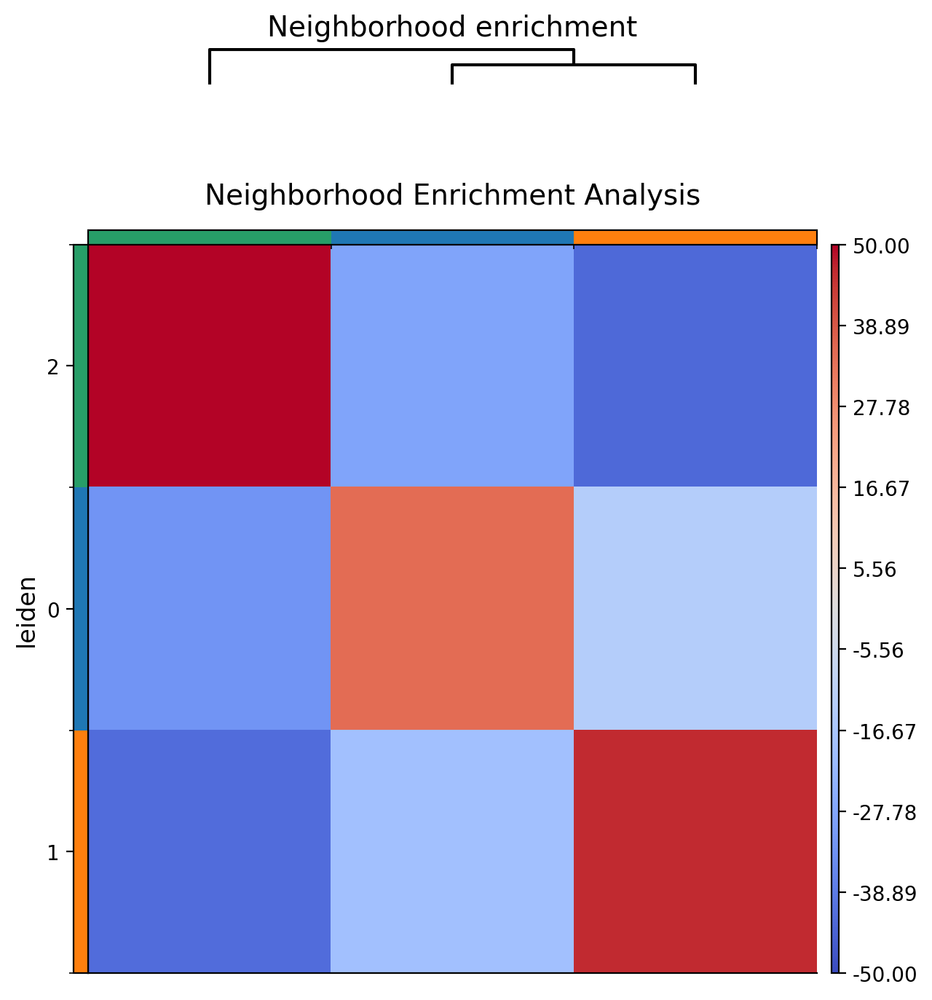


✓ Neighborhood enrichment heatmap generated


In [67]:
# Compute neighborhood enrichment
sq.gr.nhood_enrichment(
    adata,
    cluster_key='leiden'
)

print("✓ Neighborhood enrichment computed")

# Plot enrichment heatmap
fig, ax = plt.subplots(1, 1, figsize=(8, 7))

sq.pl.nhood_enrichment(
    adata,
    cluster_key='leiden',
    method='ward',
    cmap='coolwarm',
    vmin=-50,
    vmax=50,
    ax=ax,
    show=False
)

ax.set_title('Neighborhood Enrichment Analysis', fontsize=14, pad=20)
plt.tight_layout()
plt.show()

print("\n✓ Neighborhood enrichment heatmap generated")

### 5.3 Co-occurrence Score

Co-occurrence quantifies how often clusters appear together in neighborhoods.

✓ Co-occurrence computed


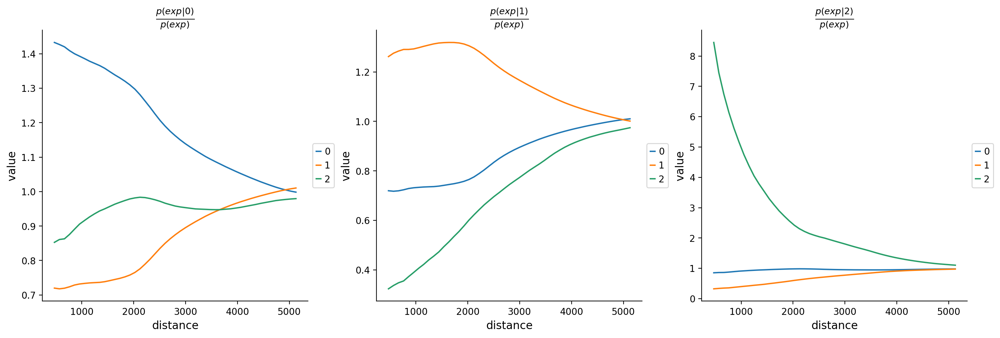

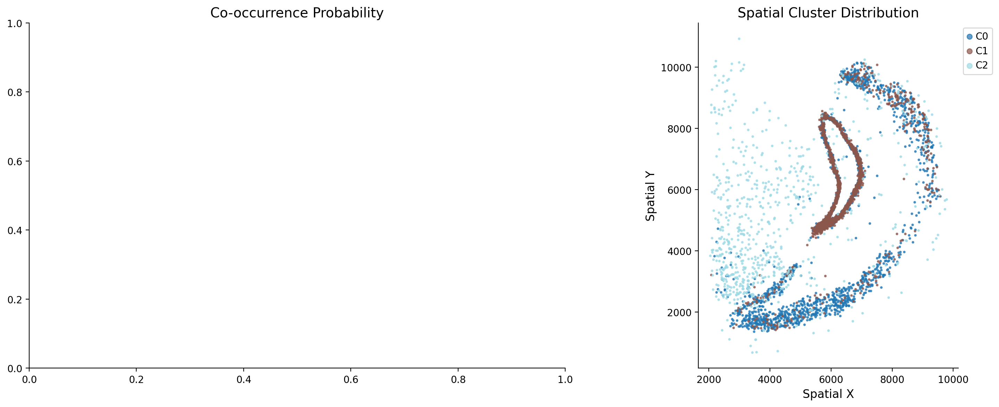


✓ Co-occurrence visualization complete


In [71]:
# Compute co-occurrence probability
sq.gr.co_occurrence(
    adata,
    cluster_key='leiden'
)

print("✓ Co-occurrence computed")

# Visualize co-occurrence
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Co-occurrence heatmap
sq.pl.co_occurrence(
    adata,
    cluster_key='leiden'
    # ax=axes[0],
    # show=False
)
plt.sca(axes[0])  # set current axis AFTER plotting
axes[0].set_title('Co-occurrence Probability', fontsize=14)

# Spatial distribution for context
coords = adata.obsm['spatial']
clusters = adata.obs['leiden'].astype(int)
n_clusters = clusters.nunique()
colors = plt.cm.tab20(np.linspace(0, 1, n_clusters))

for cluster_id in range(n_clusters):
    mask = clusters == cluster_id
    axes[1].scatter(coords[mask, 0], coords[mask, 1],
                   c=[colors[cluster_id]], label=f'C{cluster_id}',
                   s=3, alpha=0.7)

axes[1].set_xlabel('Spatial X')
axes[1].set_ylabel('Spatial Y')
axes[1].set_title('Spatial Cluster Distribution', fontsize=14)
axes[1].legend(markerscale=3, loc='upper left', bbox_to_anchor=(1, 1))
axes[1].set_aspect('equal')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

print("\n✓ Co-occurrence visualization complete")

### 5.4 Ripley's Statistics

Ripley's functions analyze spatial point patterns:
- **Ripley's K:** Measures clustering at different spatial scales
- **Ripley's L:** Normalized version of K for easier interpretation

These statistics help identify the characteristic length scales of spatial organization.

In [72]:
# Calculate Ripley's statistics
# Choose a subset of clusters for clarity
selected_clusters = sorted(adata.obs['leiden'].unique())[:4]

# Define spatial scale to analyze
max_dist = np.percentile(adata.obsp['spatial_distances'].data, 90)
radii = np.linspace(0, max_dist, 30)

print("Computing Ripley's statistics...")
sq.gr.ripley(
    adata,
    cluster_key='leiden',
    mode='L',  # Use L-function (stabilized K-function)
    spatial_key='spatial',
    max_dist=max_dist
)

print("✓ Ripley's L-function computed")

Computing Ripley's statistics...


QhullError: QH6154 Qhull precision error: Initial simplex is flat (facet 1 is coplanar with the interior point)

While executing:  | qhull i Qt
Options selected for Qhull 2020.2.r 2020/08/31:
  run-id 1626479559  incidence  Qtriangulate  _pre-merge  _zero-centrum
  _max-width 1e+04  Error-roundoff 1.5e-11  _one-merge 1.1e-10
  _near-inside 5.3e-10  Visible-distance 3e-11  U-max-coplanar 3e-11
  Width-outside 6.1e-11  _wide-facet 1.8e-10  _maxoutside 1.2e-10

The input to qhull appears to be less than 3 dimensional, or a
computation has overflowed.

Qhull could not construct a clearly convex simplex from points:
- p710(v4): 3.4e+03 6.7e+02 7.3e+03
- p2105(v3): 3e+03 1.1e+04 7.3e+03
- p1994(v2): 9.8e+03 5.7e+03 7.3e+03
- p1564(v1): 2.1e+03 3.8e+03 7.3e+03

The center point is coplanar with a facet, or a vertex is coplanar
with a neighboring facet.  The maximum round off error for
computing distances is 1.5e-11.  The center point, facets and distances
to the center point are as follows:

center point     4559     5283     7280

facet p2105 p1994 p1564 distance=    0
facet p710 p1994 p1564 distance=    0
facet p710 p2105 p1564 distance=    0
facet p710 p2105 p1994 distance=    0

These points either have a maximum or minimum x-coordinate, or
they maximize the determinant for k coordinates.  Trial points
are first selected from points that maximize a coordinate.

The min and max coordinates for each dimension are:
  0:      2051      9775  difference= 7724
  1:     673.8  1.094e+04  difference= 1.026e+04
  2:      7280      7280  difference=    0

If the input should be full dimensional, you have several options that
may determine an initial simplex:
  - use 'QJ'  to joggle the input and make it full dimensional
  - use 'QbB' to scale the points to the unit cube
  - use 'QR0' to randomly rotate the input for different maximum points
  - use 'Qs'  to search all points for the initial simplex
  - use 'En'  to specify a maximum roundoff error less than 1.5e-11.
  - trace execution with 'T3' to see the determinant for each point.

If the input is lower dimensional:
  - use 'QJ' to joggle the input and make it full dimensional
  - use 'Qbk:0Bk:0' to delete coordinate k from the input.  You should
    pick the coordinate with the least range.  The hull will have the
    correct topology.
  - determine the flat containing the points, rotate the points
    into a coordinate plane, and delete the other coordinates.
  - add one or more points to make the input full dimensional.


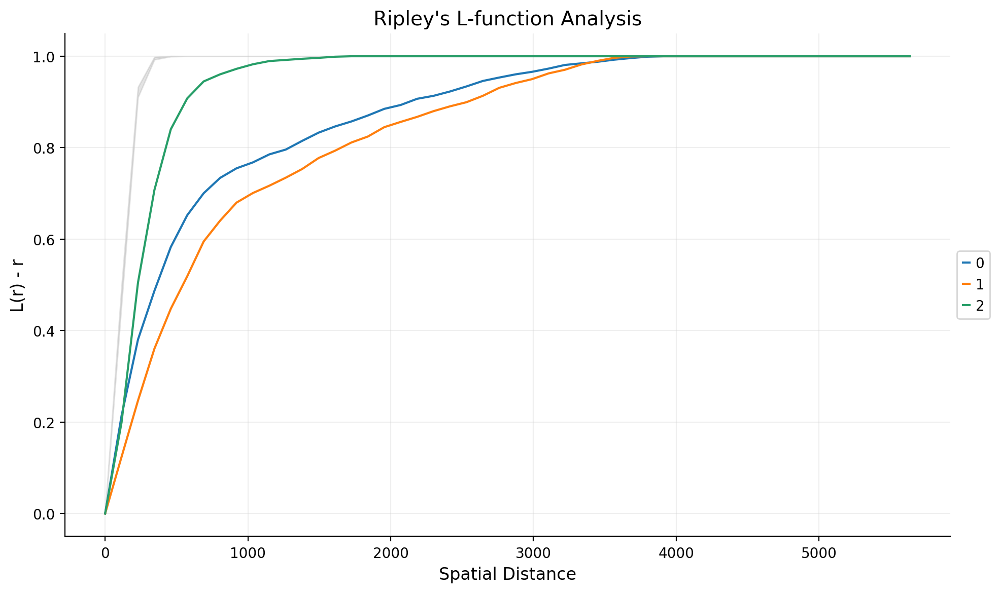


✓ Ripley's statistics visualization complete

Interpretation:
  - L(r) - r > 0: Clustering at distance r
  - L(r) - r = 0: Random spatial pattern
  - L(r) - r < 0: Dispersion at distance r


In [78]:
adata.obsm['spatial_2d'] = adata.obsm['spatial'][:, :2]
sq.gr.ripley(
    adata,
    cluster_key='leiden',
    spatial_key='spatial_2d',
    mode='F'   # or 'K' or 'L'
)

# Plot Ripley's statistics
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
sq.pl.ripley(
    adata,
    cluster_key='leiden',
    ax=ax
)

ax.set_title("Ripley's L-function Analysis", fontsize=14)
ax.set_xlabel('Spatial Distance', fontsize=12)
ax.set_ylabel('L(r) - r', fontsize=12)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Ripley's statistics visualization complete")
print("\nInterpretation:")
print("  - L(r) - r > 0: Clustering at distance r")
print("  - L(r) - r = 0: Random spatial pattern")
print("  - L(r) - r < 0: Dispersion at distance r")

## 6. Spatial Domain Detection

Spatial domain detection identifies contiguous tissue regions with distinct molecular profiles. Unlike standard clustering (which ignores space), spatial clustering ensures that spots in the same cluster are spatially close.

We'll compare standard Leiden clustering with spatially-constrained clustering.

In [79]:
# Standard Leiden clustering (already computed)
print("Standard Leiden clustering already computed")
print(f"  Number of clusters: {adata.obs['leiden'].nunique()}")

# Spatial Leiden clustering (using spatial graph)
print("\nComputing spatial Leiden clustering...")

# Build combined graph: transcriptomic + spatial
# Use spatial graph directly for spatially-constrained clustering
from scipy.sparse import csr_matrix

# Store original connectivities
original_conn = adata.obsp['connectivities'].copy()

# Temporarily replace with spatial connectivities
adata.obsp['connectivities'] = adata.obsp['spatial_connectivities'].copy()

# Run Leiden on spatial graph
sc.tl.leiden(
    adata,
    resolution=0.03,
    key_added='leiden_spatial',
    random_state=42
)

# Restore original connectivities
adata.obsp['connectivities'] = original_conn

print(f"✓ Spatial Leiden clustering complete")
print(f"  Number of spatial domains: {adata.obs['leiden_spatial'].nunique()}")

Standard Leiden clustering already computed
  Number of clusters: 3

Computing spatial Leiden clustering...
✓ Spatial Leiden clustering complete
  Number of spatial domains: 8


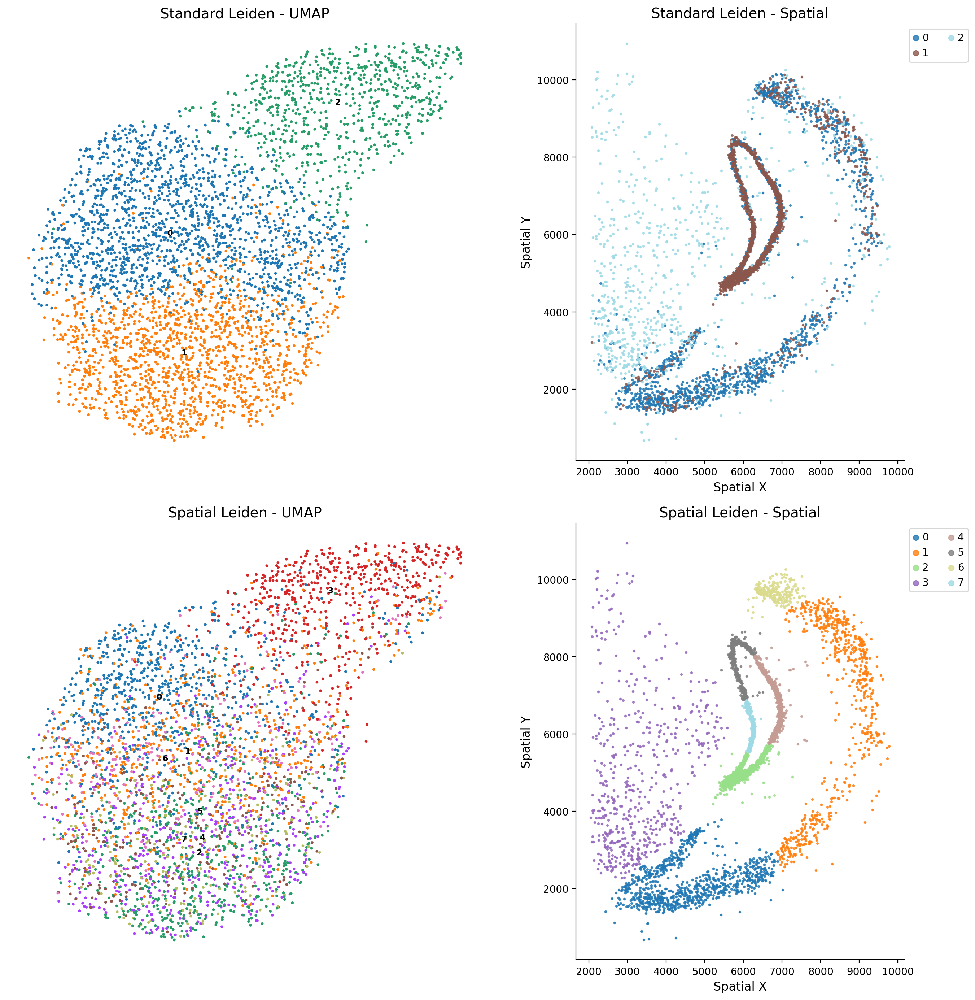


✓ Comparison of standard vs spatial clustering complete

Key difference:
  - Standard clustering: Based on gene expression similarity only
  - Spatial clustering: Enforces spatial contiguity of domains


In [80]:
# Compare standard vs spatial clustering
fig, axes = plt.subplots(2, 2, figsize=(14, 14))

coords = adata.obsm['spatial']

# Standard Leiden - UMAP
sc.pl.umap(adata, color='leiden', ax=axes[0, 0], show=False, frameon=False,
           title='Standard Leiden - UMAP', legend_loc='on data', legend_fontsize=8)

# Standard Leiden - Spatial
clusters = adata.obs['leiden'].astype(int)
n_clusters = clusters.nunique()
colors = plt.cm.tab20(np.linspace(0, 1, n_clusters))

for cluster_id in range(n_clusters):
    mask = clusters == cluster_id
    axes[0, 1].scatter(coords[mask, 0], coords[mask, 1],
                      c=[colors[cluster_id]], label=f'{cluster_id}',
                      s=3, alpha=0.8)

axes[0, 1].set_xlabel('Spatial X')
axes[0, 1].set_ylabel('Spatial Y')
axes[0, 1].set_title('Standard Leiden - Spatial')
axes[0, 1].legend(markerscale=3, ncol=2, loc='upper left', bbox_to_anchor=(1, 1))
axes[0, 1].set_aspect('equal')
axes[0, 1].spines['top'].set_visible(False)
axes[0, 1].spines['right'].set_visible(False)

# Spatial Leiden - UMAP
sc.pl.umap(adata, color='leiden_spatial', ax=axes[1, 0], show=False, frameon=False,
           title='Spatial Leiden - UMAP', legend_loc='on data', legend_fontsize=8)

# Spatial Leiden - Spatial
clusters_spatial = adata.obs['leiden_spatial'].astype(int)
n_clusters_spatial = clusters_spatial.nunique()
colors_spatial = plt.cm.tab20(np.linspace(0, 1, n_clusters_spatial))

for cluster_id in range(n_clusters_spatial):
    mask = clusters_spatial == cluster_id
    axes[1, 1].scatter(coords[mask, 0], coords[mask, 1],
                      c=[colors_spatial[cluster_id]], label=f'{cluster_id}',
                      s=3, alpha=0.8)

axes[1, 1].set_xlabel('Spatial X')
axes[1, 1].set_ylabel('Spatial Y')
axes[1, 1].set_title('Spatial Leiden - Spatial')
axes[1, 1].legend(markerscale=3, ncol=2, loc='upper left', bbox_to_anchor=(1, 1))
axes[1, 1].set_aspect('equal')
axes[1, 1].spines['top'].set_visible(False)
axes[1, 1].spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

print("\n✓ Comparison of standard vs spatial clustering complete")
print("\nKey difference:")
print("  - Standard clustering: Based on gene expression similarity only")
print("  - Spatial clustering: Enforces spatial contiguity of domains")

## 7. Ligand-Receptor Interaction Analysis

Cell-cell communication analysis identifies potential signaling interactions between cell types based on ligand-receptor expression.

**Method:** We use Squidpy's implementation which:
1. Identifies expressed ligand-receptor pairs
2. Tests for enrichment in spatially adjacent clusters
3. Accounts for spatial proximity

In [81]:
# Load ligand-receptor database
# Squidpy includes curated databases from CellPhoneDB and other sources
print("Loading ligand-receptor database...")

try:
    # This will download the database if not already cached
    sq.gr.ligrec(
        adata,
        n_perms=100,  # Number of permutations for significance testing
        cluster_key='leiden',
        copy=False,
        use_raw=False,
        transmitter_params={'categories': 'ligand'},
        receiver_params={'categories': 'receptor'}
    )

    print("\n✓ Ligand-receptor analysis complete")

    # Check if results were computed
    if 'leiden_ligrec' in adata.uns:
        lr_results = adata.uns['leiden_ligrec']
        print(f"  Tested interactions: {len(lr_results)}")

        # Filter significant interactions
        if 'pvalues' in lr_results:
            sig_interactions = (lr_results['pvalues'] < 0.05).sum().sum()
            print(f"  Significant interactions (p < 0.05): {sig_interactions}")
    else:
        print("  No results stored in adata.uns")
        lr_results = None

except Exception as e:
    print(f"\n⚠ Could not complete ligand-receptor analysis: {e}")
    print("This may be due to gene name format or database compatibility.")
    lr_results = None

Loading ligand-receptor database...


  0%|          | 0/100 [00:00<?, ?permutation/s]


✓ Ligand-receptor analysis complete
  Tested interactions: 3
  Significant interactions (p < 0.05): 9


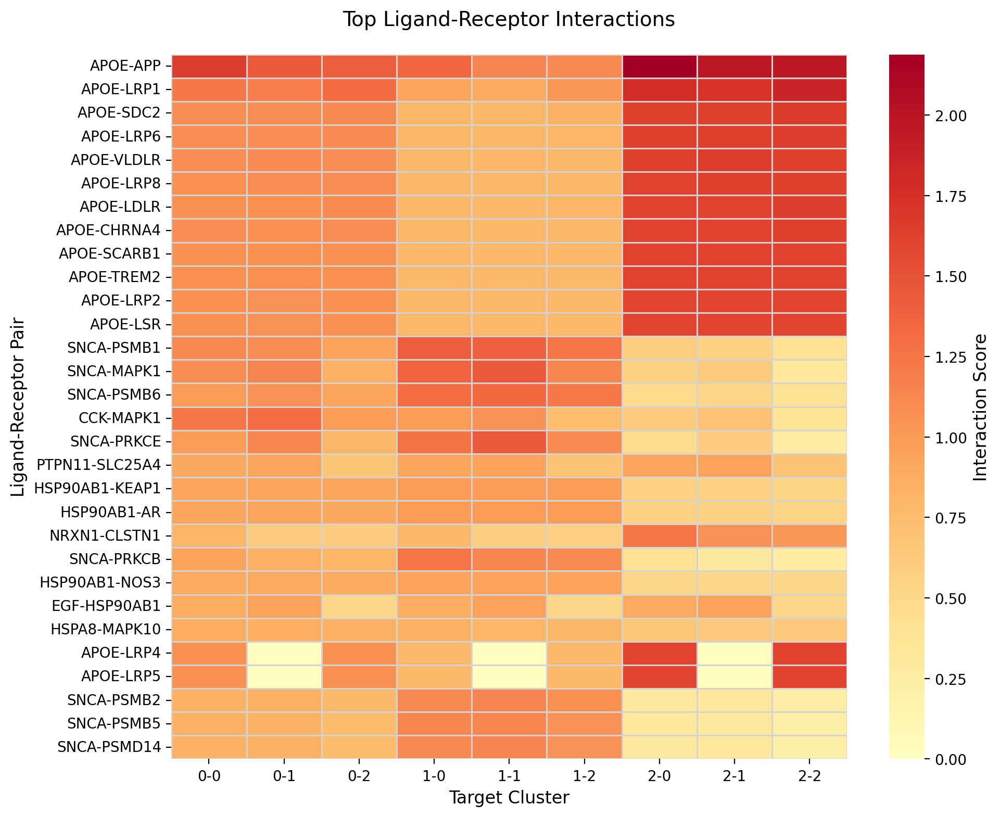


✓ Ligand-receptor interaction heatmap generated


In [52]:
# Visualize top ligand-receptor interactions
if lr_results is not None and 'means' in lr_results:
    # Get interaction means
    lr_means = lr_results['means']

    # Plot interaction heatmap for top interactions
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    # Show top 30 interactions
    top_interactions = lr_means.sum(axis=1).sort_values(ascending=False).head(30)

    sns.heatmap(
        lr_means.loc[top_interactions.index],
        cmap='RdYlBu_r',
        center=0,
        cbar_kws={'label': 'Interaction Score'},
        ax=ax,
        linewidths=0.5,
        linecolor='lightgray'
    )

    ax.set_title('Top Ligand-Receptor Interactions', fontsize=14, pad=20)
    ax.set_xlabel('Target Cluster', fontsize=12)
    ax.set_ylabel('Ligand-Receptor Pair', fontsize=12)

    plt.tight_layout()
    plt.show()

    print("\n✓ Ligand-receptor interaction heatmap generated")
else:
    print("\nSkipping ligand-receptor visualization (insufficient data)")
    print("\nNote: For a complete ligand-receptor analysis, you may want to:")
    print("  1. Use CellPhoneDB or CellChat standalone")
    print("  2. Ensure gene names match the database format")
    print("  3. Use single-cell resolution data (not binned spatial data)")

## 8. Advanced Spatial Patterns

### 8.1 Spatial Gradients

Spatial gradients reveal genes whose expression changes smoothly across tissue space, often indicating morphogen-like patterning or tissue zonation.

In [53]:
# Identify genes with spatial gradients
# Use correlation with spatial coordinates as a simple gradient metric

coords = adata.obsm['spatial']
gradient_scores = []

print("Computing spatial gradient scores...")

# Test top 500 variable genes for efficiency
test_genes = adata.var_names[adata.var['highly_variable']][:500]

for gene in test_genes:
    gene_idx = adata.var_names.get_loc(gene)
    expression = adata.X[:, gene_idx].toarray().flatten() if issparse(adata.X) else adata.X[:, gene_idx]

    # Compute correlation with spatial axes
    corr_x = abs(np.corrcoef(coords[:, 0], expression)[0, 1])
    corr_y = abs(np.corrcoef(coords[:, 1], expression)[0, 1])

    # Gradient score is the maximum correlation
    gradient_score = max(corr_x, corr_y)

    gradient_scores.append({
        'gene': gene,
        'gradient_score': gradient_score,
        'corr_x': corr_x if corr_x == gradient_score else 0,
        'corr_y': corr_y if corr_y == gradient_score else 0
    })

gradient_df = pd.DataFrame(gradient_scores).sort_values('gradient_score', ascending=False)

print(f"\n✓ Gradient analysis complete")
print(f"\nTop 10 genes with strongest spatial gradients:")
print(gradient_df.head(10))

Computing spatial gradient scores...

✓ Gradient analysis complete

Top 10 genes with strongest spatial gradients:
         gene  gradient_score    corr_x    corr_y
136    Atp1a2        0.260089  0.260089  0.000000
83        Agt        0.251500  0.251500  0.000000
228      Cdk8        0.247522  0.000000  0.247522
406     Erbb4        0.234141  0.234141  0.000000
40   AY036118        0.197672  0.000000  0.197672
90    Aldh1a1        0.195547  0.195547  0.000000
414    Etnppl        0.182260  0.182260  0.000000
92      Aldoc        0.180652  0.180652  0.000000
400      Enc1        0.158735  0.158735  0.000000
348       Dmd        0.156525  0.156525  0.000000


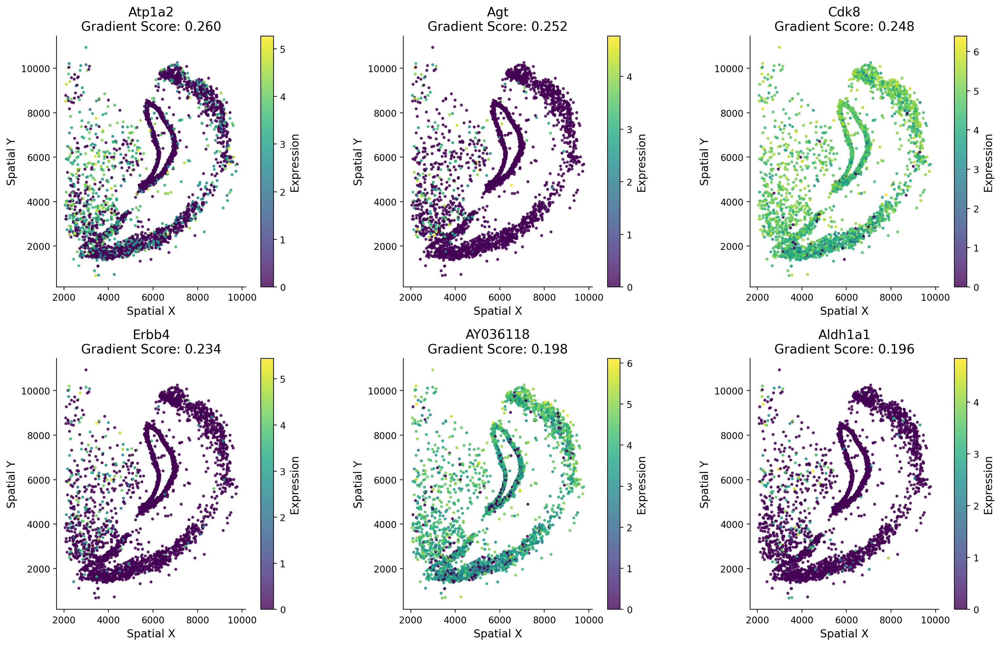


✓ Spatial gradient visualization complete


In [54]:
# Visualize top gradient genes
top_gradient_genes = gradient_df.head(6)['gene'].tolist()

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for idx, gene in enumerate(top_gradient_genes):
    gene_idx = adata.var_names.get_loc(gene)
    expression = adata.X[:, gene_idx].toarray().flatten() if issparse(adata.X) else adata.X[:, gene_idx]

    gradient_score = gradient_df[gradient_df['gene'] == gene]['gradient_score'].values[0]

    scatter = axes[idx].scatter(coords[:, 0], coords[:, 1],
                               c=expression, cmap='viridis',
                               s=5, alpha=0.8)

    axes[idx].set_title(f"{gene}\nGradient Score: {gradient_score:.3f}")
    axes[idx].set_xlabel('Spatial X')
    axes[idx].set_ylabel('Spatial Y')
    axes[idx].set_aspect('equal')
    axes[idx].spines['top'].set_visible(False)
    axes[idx].spines['right'].set_visible(False)

    plt.colorbar(scatter, ax=axes[idx], label='Expression')

plt.tight_layout()
plt.show()

print("\n✓ Spatial gradient visualization complete")

### 8.2 Distance-based Analysis

Analyze how gene expression changes with distance from tissue landmarks or boundaries.

In [55]:
# Define a tissue center or landmark (e.g., centroid of a specific cluster)
# Here we use cluster 0 as an example landmark

landmark_cluster = '0'
landmark_mask = adata.obs['leiden'] == landmark_cluster
landmark_coords = coords[landmark_mask]
landmark_center = landmark_coords.mean(axis=0)

# Calculate distance from each spot to the landmark
distances = np.sqrt(((coords - landmark_center) ** 2).sum(axis=1))
adata.obs['distance_to_landmark'] = distances

print(f"✓ Distance from landmark (Cluster {landmark_cluster} center) computed")
print(f"  Landmark center: ({landmark_center[0]:.1f}, {landmark_center[1]:.1f})")
print(f"  Distance range: {distances.min():.1f} to {distances.max():.1f}")

✓ Distance from landmark (Cluster 0 center) computed
  Landmark center: (6100.9, 5022.3)
  Distance range: 3.8 to 6684.0


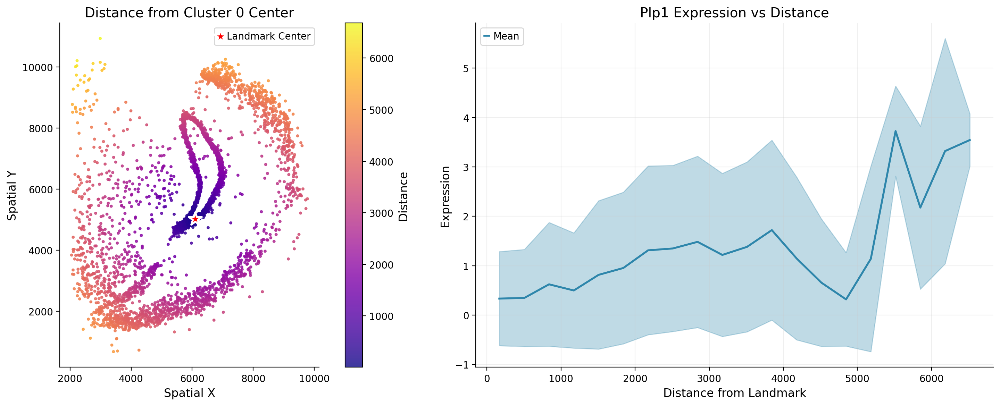


✓ Distance-based analysis visualization complete


In [56]:
# Visualize distance and analyze expression patterns
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot distance from landmark
scatter = axes[0].scatter(coords[:, 0], coords[:, 1],
                         c=distances, cmap='plasma',
                         s=5, alpha=0.8)
axes[0].scatter(landmark_center[0], landmark_center[1],
               c='red', s=200, marker='*',
               edgecolors='white', linewidths=2,
               label='Landmark Center', zorder=10)
axes[0].set_xlabel('Spatial X')
axes[0].set_ylabel('Spatial Y')
axes[0].set_title(f'Distance from Cluster {landmark_cluster} Center')
axes[0].set_aspect('equal')
axes[0].legend()
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
plt.colorbar(scatter, ax=axes[0], label='Distance')

# Analyze expression vs distance for a marker gene
# Use the top spatially variable gene
if len(significant_genes) > 0:
    example_gene = significant_genes.index[0]
    gene_idx = adata.var_names.get_loc(example_gene)
    expression = adata.X[:, gene_idx].toarray().flatten() if issparse(adata.X) else adata.X[:, gene_idx]

    # Bin by distance
    n_bins = 20
    dist_bins = pd.cut(distances, bins=n_bins)
    binned_expr = pd.DataFrame({
        'distance': distances,
        'expression': expression,
        'bin': dist_bins
    }).groupby('bin')['expression'].agg(['mean', 'std']).reset_index()

    bin_centers = [(interval.left + interval.right) / 2 for interval in binned_expr['bin']]

    axes[1].plot(bin_centers, binned_expr['mean'],
                color=COLORS['primary'], linewidth=2, label='Mean')
    axes[1].fill_between(bin_centers,
                         binned_expr['mean'] - binned_expr['std'],
                         binned_expr['mean'] + binned_expr['std'],
                         alpha=0.3, color=COLORS['primary'])

    axes[1].set_xlabel('Distance from Landmark')
    axes[1].set_ylabel('Expression')
    axes[1].set_title(f'{example_gene} Expression vs Distance')
    axes[1].legend()
    axes[1].spines['top'].set_visible(False)
    axes[1].spines['right'].set_visible(False)
    axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Distance-based analysis visualization complete")

## 9. Integration and Summary

### 9.1 Comprehensive Summary of Spatial Features

In [57]:
# Create a comprehensive summary DataFrame
summary_data = []

# For each gene, collect all spatial metrics
common_genes = set(morans_results.index) & set(gearys_results.index) & set(hs_results.index)
common_genes = list(common_genes)[:100]  # Limit to top 100 for efficiency

for gene in common_genes:
    summary_data.append({
        'gene': gene,
        'morans_i': morans_results.loc[gene, 'I'],
        'morans_pval': morans_results.loc[gene, 'pval_norm_fdr_bh'],
        'gearys_c': gearys_results.loc[gene, 'C'],
        'gearys_pval': gearys_results.loc[gene, 'pval_norm_fdr_bh'],
        'hotspot_z': hs_results.loc[gene, 'Z'] if gene in hs_results.index else np.nan,
        'hotspot_pval': hs_results.loc[gene, 'FDR'] if gene in hs_results.index else np.nan
    })

spatial_summary = pd.DataFrame(summary_data)

# Mark genes significant by different methods
spatial_summary['sig_morans'] = spatial_summary['morans_pval'] < 0.05
spatial_summary['sig_gearys'] = spatial_summary['gearys_pval'] < 0.05
spatial_summary['sig_hotspot'] = spatial_summary['hotspot_pval'] < 0.05
spatial_summary['n_methods_sig'] = (spatial_summary['sig_morans'].astype(int) +
                                    spatial_summary['sig_gearys'].astype(int) +
                                    spatial_summary['sig_hotspot'].astype(int))

print("="*80)
print("SPATIAL ANALYSIS SUMMARY")
print("="*80)

print(f"\nGenes analyzed: {len(spatial_summary)}")
print(f"\nSignificance by method:")
print(f"  Moran's I: {spatial_summary['sig_morans'].sum()} genes")
print(f"  Geary's C: {spatial_summary['sig_gearys'].sum()} genes")
print(f"  Hotspot: {spatial_summary['sig_hotspot'].sum()} genes")

print(f"\nConsensus genes (significant by multiple methods):")
print(spatial_summary['n_methods_sig'].value_counts().sort_index(ascending=False))

# Get consensus genes (significant by all 3 methods)
consensus_genes = spatial_summary[spatial_summary['n_methods_sig'] == 3].sort_values('morans_i', ascending=False)
print(f"\nTop 10 consensus spatially variable genes:")
print(consensus_genes.head(10)[['gene', 'morans_i', 'gearys_c', 'hotspot_z']])

SPATIAL ANALYSIS SUMMARY

Genes analyzed: 100

Significance by method:
  Moran's I: 13 genes
  Geary's C: 61 genes
  Hotspot: 19 genes

Consensus genes (significant by multiple methods):
n_methods_sig
3     5
2    13
1    52
0    30
Name: count, dtype: int64

Top 10 consensus spatially variable genes:
       gene  morans_i  gearys_c  hotspot_z
8       Trh  0.264008  0.755778  10.739473
9    Hba-a2  0.065857  0.908414  18.719074
78    Usp53  0.029379  0.926534   5.078459
56  Kansl1l  0.024344  0.950143   4.005911
52     Gpc6  0.023606  0.898302   9.603030


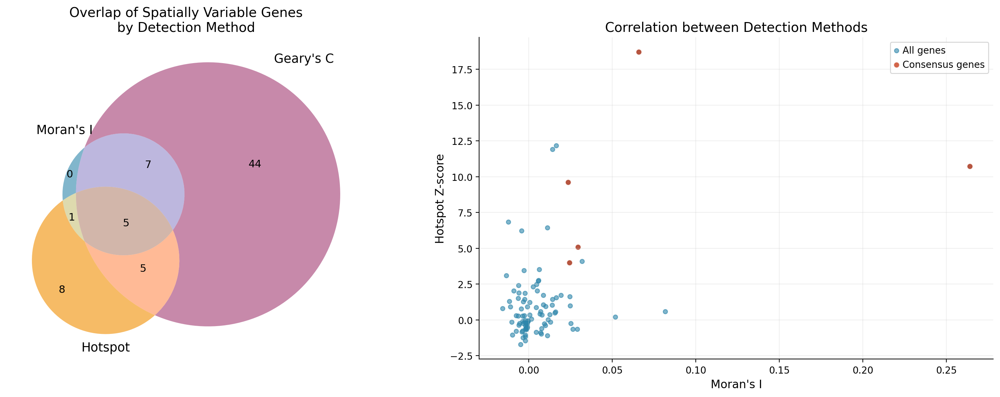


✓ Method comparison visualization complete


In [58]:
# Visualize method agreement
from matplotlib_venn import venn3

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Venn diagram of significant genes
morans_set = set(spatial_summary[spatial_summary['sig_morans']]['gene'])
gearys_set = set(spatial_summary[spatial_summary['sig_gearys']]['gene'])
hotspot_set = set(spatial_summary[spatial_summary['sig_hotspot']]['gene'])

venn3([morans_set, gearys_set, hotspot_set],
      set_labels=("Moran's I", "Geary's C", 'Hotspot'),
      ax=axes[0],
      set_colors=(COLORS['primary'], COLORS['secondary'], COLORS['tertiary']),
      alpha=0.6)
axes[0].set_title('Overlap of Spatially Variable Genes\nby Detection Method', fontsize=14)

# Scatter plot matrix
valid_data = spatial_summary.dropna()
axes[1].scatter(valid_data['morans_i'], valid_data['hotspot_z'],
               c=COLORS['primary'], s=20, alpha=0.6, label='All genes')

# Highlight consensus genes
consensus_data = valid_data[valid_data['n_methods_sig'] == 3]
axes[1].scatter(consensus_data['morans_i'], consensus_data['hotspot_z'],
               c=COLORS['quaternary'], s=40, alpha=0.8, label='Consensus genes',
               edgecolors='white', linewidths=1)

axes[1].set_xlabel("Moran's I")
axes[1].set_ylabel('Hotspot Z-score')
axes[1].set_title('Correlation between Detection Methods', fontsize=14)
axes[1].legend()
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Method comparison visualization complete")

### 9.2 Final Summary Visualization

Comprehensive overview of all spatial analyses performed.

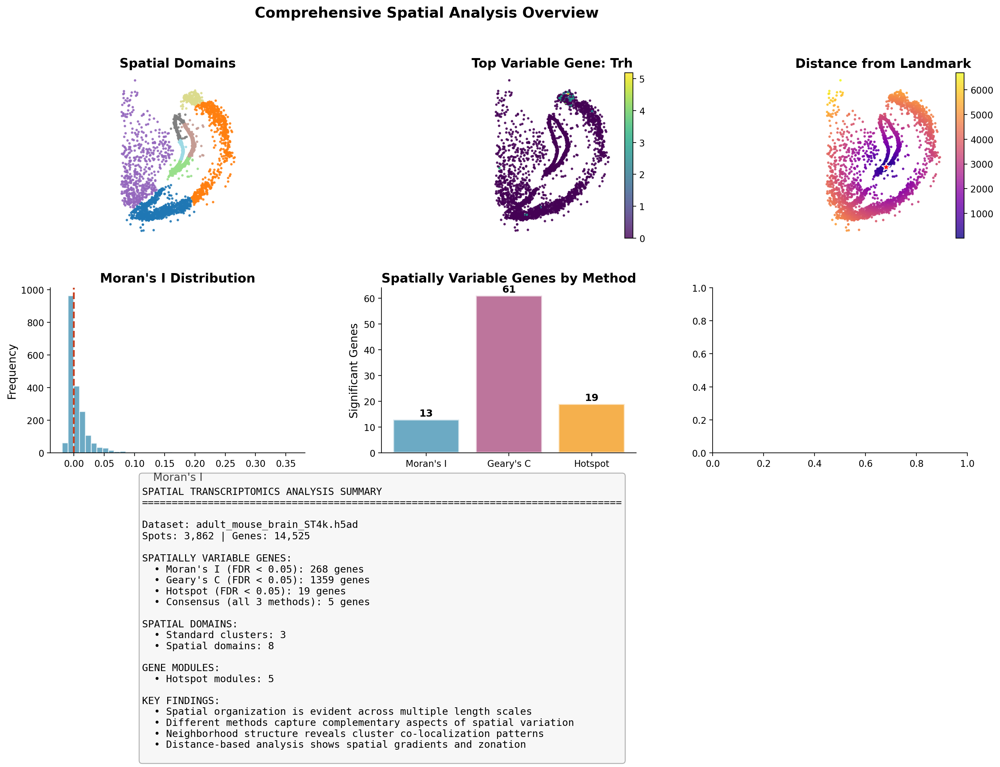


ANALYSIS COMPLETE!


In [62]:
# Create a final comprehensive visualization
fig = plt.figure(figsize=(18, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# 1. Spatial domain map
ax1 = fig.add_subplot(gs[0, 0])
clusters_spatial = adata.obs['leiden_spatial'].astype(int)
n_clusters = clusters_spatial.nunique()
colors = plt.cm.tab20(np.linspace(0, 1, n_clusters))
for cluster_id in range(n_clusters):
    mask = clusters_spatial == cluster_id
    ax1.scatter(coords[mask, 0], coords[mask, 1],
               c=[colors[cluster_id]], s=3, alpha=0.8)
ax1.set_title('Spatial Domains', fontweight='bold')
ax1.set_aspect('equal')
ax1.axis('off')

# 2. Top spatially variable gene
ax2 = fig.add_subplot(gs[0, 1])
if len(consensus_genes) > 0:
    top_gene = consensus_genes.iloc[0]['gene']
    gene_idx = adata.var_names.get_loc(top_gene)
    expression = adata.X[:, gene_idx].toarray().flatten() if issparse(adata.X) else adata.X[:, gene_idx]
    scatter = ax2.scatter(coords[:, 0], coords[:, 1], c=expression,
                         cmap='viridis', s=3, alpha=0.8)
    ax2.set_title(f'Top Variable Gene: {top_gene}', fontweight='bold')
    ax2.set_aspect('equal')
    ax2.axis('off')
    plt.colorbar(scatter, ax=ax2, fraction=0.046, pad=0.04)

# 3. Distance from landmark
ax3 = fig.add_subplot(gs[0, 2])
scatter = ax3.scatter(coords[:, 0], coords[:, 1],
                     c=distances, cmap='plasma', s=3, alpha=0.8)
ax3.scatter(landmark_center[0], landmark_center[1],
           c='red', s=100, marker='*', edgecolors='white', linewidths=1, zorder=10)
ax3.set_title('Distance from Landmark', fontweight='bold')
ax3.set_aspect('equal')
ax3.axis('off')
plt.colorbar(scatter, ax=ax3, fraction=0.046, pad=0.04)

# 4. Moran's I distribution
ax4 = fig.add_subplot(gs[1, 0])
ax4.hist(morans_results['I'], bins=40, color=COLORS['primary'], alpha=0.7, edgecolor='white')
ax4.axvline(x=0, color=COLORS['quaternary'], linestyle='--', linewidth=2)
ax4.set_xlabel("Moran's I")
ax4.set_ylabel('Frequency')
ax4.set_title("Moran's I Distribution", fontweight='bold')
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

# 5. Method comparison
ax5 = fig.add_subplot(gs[1, 1])
method_counts = [
    spatial_summary['sig_morans'].sum(),
    spatial_summary['sig_gearys'].sum(),
    spatial_summary['sig_hotspot'].sum()
]
methods = ["Moran's I", "Geary's C", 'Hotspot']
bars = ax5.bar(methods, method_counts,
               color=[COLORS['primary'], COLORS['secondary'], COLORS['tertiary']],
               alpha=0.7, edgecolor='white', linewidth=2)
ax5.set_ylabel('Significant Genes')
ax5.set_title('Spatially Variable Genes by Method', fontweight='bold')
ax5.spines['top'].set_visible(False)
ax5.spines['right'].set_visible(False)
for i, v in enumerate(method_counts):
    ax5.text(i, v + max(method_counts)*0.02, str(v), ha='center', fontweight='bold')

# 6. Neighborhood enrichment
ax6 = fig.add_subplot(gs[1, 2])
if 'leiden_nhood_enrichment' in adata.uns:
    enrich_data = adata.uns['leiden_nhood_enrichment']['zscore']
    im = ax6.imshow(enrich_data, cmap='coolwarm', vmin=-3, vmax=3, aspect='auto')
    ax6.set_xticks(range(len(enrich_data)))
    ax6.set_yticks(range(len(enrich_data)))
    ax6.set_xticklabels(range(len(enrich_data)))
    ax6.set_yticklabels(range(len(enrich_data)))
    ax6.set_title('Neighborhood Enrichment', fontweight='bold')
    plt.colorbar(im, ax=ax6, fraction=0.046, pad=0.04)

# 7-9. Bottom row: Statistical summaries
ax7 = fig.add_subplot(gs[2, :])
ax7.axis('off')

summary_text = f"""
SPATIAL TRANSCRIPTOMICS ANALYSIS SUMMARY
{'='*80}

Dataset: {data_path.split('/')[-1]}
Spots: {adata.n_obs:,} | Genes: {adata.n_vars:,}

SPATIALLY VARIABLE GENES:
  • Moran's I (FDR < 0.05): {len(morans_sig_genes)} genes
  • Geary's C (FDR < 0.05): {len(gearys_sig_genes)} genes
  • Hotspot (FDR < 0.05): {len(hotspot_set)} genes
  • Consensus (all 3 methods): {len(consensus_genes)} genes

SPATIAL DOMAINS:
  • Standard clusters: {adata.obs['leiden'].nunique()}
  • Spatial domains: {adata.obs['leiden_spatial'].nunique()}

GENE MODULES:
  • Hotspot modules: {len(modules.unique()) if modules is not None else 'N/A'}

KEY FINDINGS:
  • Spatial organization is evident across multiple length scales
  • Different methods capture complementary aspects of spatial variation
  • Neighborhood structure reveals cluster co-localization patterns
  • Distance-based analysis shows spatial gradients and zonation
"""

ax7.text(0.1, 0.3, summary_text,
        transform=ax7.transAxes,
        fontsize=11,
        verticalalignment='center',
        fontfamily='monospace',
        bbox=dict(boxstyle='round', facecolor=COLORS['light_gray'], alpha=0.3))

plt.suptitle('Comprehensive Spatial Analysis Overview',
             fontsize=16, fontweight='bold', y=0.995)

plt.show()

print("\n" + "="*80)
print("ANALYSIS COMPLETE!")
print("="*80)

## 10. Export Results

Save processed data and analysis results for future use.

In [90]:
# Save spatial analysis results to CSV
results_dir = '../data/spatial_analysis_results/'
os.makedirs(results_dir, exist_ok=True)

# Save various results tables
morans_results.to_csv(f"{results_dir}morans_i_results.csv")
gearys_results.to_csv(f"{results_dir}gearys_c_results.csv")
hs_results.to_csv(f"{results_dir}hotspot_results.csv")
spatial_summary.to_csv(f"{results_dir}spatial_summary.csv", index=False)
gradient_df.to_csv(f"{results_dir}gradient_genes.csv", index=False)

if modules is not None:
    pd.DataFrame(modules).to_csv(f"{results_dir}hotspot_modules.csv")

print(f"\n✓ Analysis results saved to: {results_dir}")
print("\nSaved files:")
print("  - morans_i_results.csv")
print("  - gearys_c_results.csv")
print("  - hotspot_results.csv")
print("  - spatial_summary.csv")
print("  - gradient_genes.csv")
if modules is not None:
    print("  - hotspot_modules.csv")

print("\n" + "="*80)
print("ALL ANALYSES COMPLETE AND SAVED!")
print("="*80)


✓ Analysis results saved to: ../data/spatial_analysis_results/

Saved files:
  - morans_i_results.csv
  - gearys_c_results.csv
  - hotspot_results.csv
  - spatial_summary.csv
  - gradient_genes.csv
  - hotspot_modules.csv

ALL ANALYSES COMPLETE AND SAVED!
